# Seurat Analysis of BD Rhapsody PBMC scRNA-seq data reported in Schulte-Schrepping et al., 2020, "Severe COVID-19 is marked by a dysregulated myeloid cell compartment"

<font color='red'>**Figure 2D and related figures**</font> 

**The analysis at hand is based on the fresh and cryopreserved PBMC samples only.**

In [ ]:
#library(fgread)
library(Seurat)
library(SingleR)
library(ggplot2)
library(RColorBrewer)

In [2]:
# Place all your parameter values and options here.

options(repr.plot.width=10, repr.plot.height=10)

color_clusters<-c(brewer.pal(n = 9,name = "Set1"),
                  brewer.pal(n = 8,name = "Set2"),
                  brewer.pal(n = 12,name = "Set3"),
                  brewer.pal(n = 12,name = "Paired"),
                  brewer.pal(n = 9,name = "Pastel1"),
                  brewer.pal(n = 8,name = "Pastel2"),
                  brewer.pal(n = 8,name = "Accent"))

singleR_colors <- c("T cells" = "#776fb2",
                    "T_cells" = "#776fb2",
                    "CD4+ T-cells (naive)" = "#cecce2",
                    "CD4+ T-cells" = "#cecce2",
                    "CD4+ T cells" = "#cecce2",
                    "T cells, CD4+" = "#cecce2",
                    "CD4+/CD45RA+/CD25- Naive T" = "#cecce2",
                    "CD4+ T Helper2" = "#cecce2",
                    "CD4+ Tcm" = "#cecce2",
                    "CD4+/CD45RO+ Memory" = "#cecce2",
                    "CD4+ memory T-cells" = "#cecce2",
                    "CD4+ Tem" = "#cecce2",
                    
                    "CD8+ T-cells (naive)" = "#422483",
                    "CD8+/CD45RA+ Naive Cytotoxic" = "#422483",
                    "CD8+ T-cells" = "#422483",
                    "CD8+ T cells" = "#422483",
                    "T cells, CD8+" = "#422483",
                    "CD8+ Tcm" = "#422483",
                    "CD8+ Cytotoxic T" = "#422483",
                    "CD8+ Tem" = "#422483",
                    
                    "Treg cells" = "#004c9d",
                    "CD4+/CD25 T Reg" = "#004c9d",
                    "regulatory T-cells" = "#004c9d",
                    
                    "NKT cells" = "#684495",
                    "NK T cells" = "#684495",
                    "NK cells" = "#338eb0",
                    "NK_cell" = "#338eb0",
                    "CD56+ NK" = "#338eb0",
                    
                    "ILCs" = "#d9dada",
                    
                    "naive B-cells" = "#00963f",
                    "B-cells" = "#00963f",
                    "B_cell" = "#00963f",
                    "B cells" = "#00963f",
                    "CD19+ B" = "#00963f",
                    "Pre-B_cell_CD34-" = "#00961a" ,
                    "Pro-B_cell_CD34+" = "#00961a",
                    "memory B-cells" = "#32ab6d",
                    "class-switched memory B-cells" = "#7dc29e",
                    "Plasma cells" = "#d5e7dd",
                    
                    "BM" = "#b3a930",
                    "BM & Prog." = "#b3a930",
                    "Progenitors" = "#b3a930", 
                    "HSC" = "#b3a930",
                    "HSCs" = "#b3a930",
                    "HSC_-G-CSF" = "#b3a930",
                    "HSC_CD34+" = "#b3a930",
                    "CD34+ Precursors" = "#b3a930",
                    "MPP" = "#dfd200",
                    "CLP" = "#ffed00",
                    "CMP" = "#fdef6d",
                    "CMPs" = "#fdef6d",
                    "GMP" = "#faf3a8",
                    "GMPs" = "#faf3a8",
                    "MEP" = "#e7bd00",
                    "MEPs" = "#e7bd00",
                    "Megakaryocytes" = "#efd873",
                    
                    "DC" = "#ef7c00",
                    "Dendritic" = "#ef7c00",
                    "Dendritic cells" = "#ef7c00",
                    
                    "Monocyte (CD16-)" = "#e6330f",
                    "Monocyte (CD16+)" = "#ea5552",
                    "Monocyte (CD14+)" = "#f4a5a5",
                    "Monocytes" = "#f4a5a5",
                    "Monocyte" = "#f4a5a5",
                    "CD14+ Monocyte" = "#f4a5a5",
                    
                    "Pro-Myelocyte" = "#001816",
                    "Myelocyte" = "#00312C",
                    "Granulocytes" = "#006358",
                    "Eosinophils" = "#00af9d",
                    "Neutrophils" = "#87cbbe",
                    "Basophils" = "#cae6e4",
                    "Macrophages" = "#b41909",
                    "Macrophage" = "#b41909",
                    "Erythrocytes" = "#bb79b2",
                    "Erythroblast" = "#bb79b2",
                    "Erythroid cells" = "#bb79b2",
                    "Platelets" = "#2a3937",
                    
                    "Adipocytes" = "#e2a9cd",
                    "Fibroblasts" = "#be348b",
                    "Endothelial cells" = "#7d2685",
                    "Endothelial_cells" = "#7d2685",
                    "mv Endothelial cells" = "#632282",
                    "Myocytes"="#A70000",
                    "Smooth_muscle_cells"="#A70000",
                    "Chondrocytes"="#F0F7DA",
                    "Epithelial_cells"="#A67C00",
                    "Neurons"="#63CDE3"
)

## Import Data Set

In [4]:
# load data from rds file
seurat_PBMC_FG <- readRDS("/prj/NUM_CODEX_PLUS/Covid19_data/cohort2.annote.rds")

The data stored in this seurat object has already been normalized and scaled. Variable genes have been detected previously and PCA, UMAP and clustering have been performed. The seurat object holds the data as presented in Figure 2D in Schulte-Schrepping et al., 2020, "Severe COVID-19 is marked by a dysregulated myeloid cell compartment". For reproducibility the code that has been run is stored in this script. 

In [5]:
colnames(seurat_PBMC_FG@meta.data)

[1] "orig.ident"                   "nCount_RNA"                  
 [3] "nFeature_RNA"                 "nCount_HTO"                  
 [5] "nFeature_HTO"                 "percent.mito"                
 [7] "meanCount_RNA"                "meanCount_HTO"               
 [9] "HTO_maxID"                    "HTO_secondID"                
[11] "HTO_margin"                   "HTO_classification"          
[13] "HTO_classification.global"    "hash.ID"                     
[15] "demultID"                     "experiment"                  
[17] "cartridge"                    "ID"                          
[19] "sample"                       "abseq"                       
[21] "date_of_sampling"             "donor"                       
[23] "cells"                        "purification"                
[25] "nCount_AB"                    "nFeature_AB"                 
[27] "group_4"                      "group"                       
[29] "diagnosis"                    "onset_of_symptoms"           
[31] "outcome"                      "oxygen"                      
[33] "highest_WHO_classification"   "primary_complaint"           
[35] "bacterial_superinfection"     "medication"                  
[37] "comorbidities"                "age"                         
[39] "sex"                          "days_after_onset"            
[41] "disease_stage"                "who_per_sample"              
[43] "group_per_sample"             "glucocorticoids"             
[45] "covid19_therapy"              "leukocyte_counts"            
[47] "neutrophil_counts"            "lymphocyte_counts"           
[49] "monocyte_counts"              "eosinophil_counts"           
[51] "basophil_counts"              "imm_granulocyte_counts"      
[53] "thrombocyte_counts"           "pCT"                         
[55] "CRP"                          "IL6"                         
[57] "group_4_per_sample"           "percent.hb"                  
[59] "group_per_sample_per_stage"   "group_4_per_sample_per_stage"
[61] "hpca.labels"                  "blueprint.labels"            
[63] "monaco.labels"                "immune.labels"               
[65] "dmap.labels"                  "hemato.labels"               
[67] "RNA_snn_res.0.5"              "seurat_clusters"             
[69] "RNA_snn_res.0.4"              "cluster_labels_res.0.5"      
[71] "cluster_labels_res.0.4"       "new_order"                   
[73] "fresh"                        "Condition"                   
[75] "cell.cond"                    "celltype"                    
[77] "celltypeL0"

# Cell Numbers

## Group vs Purification

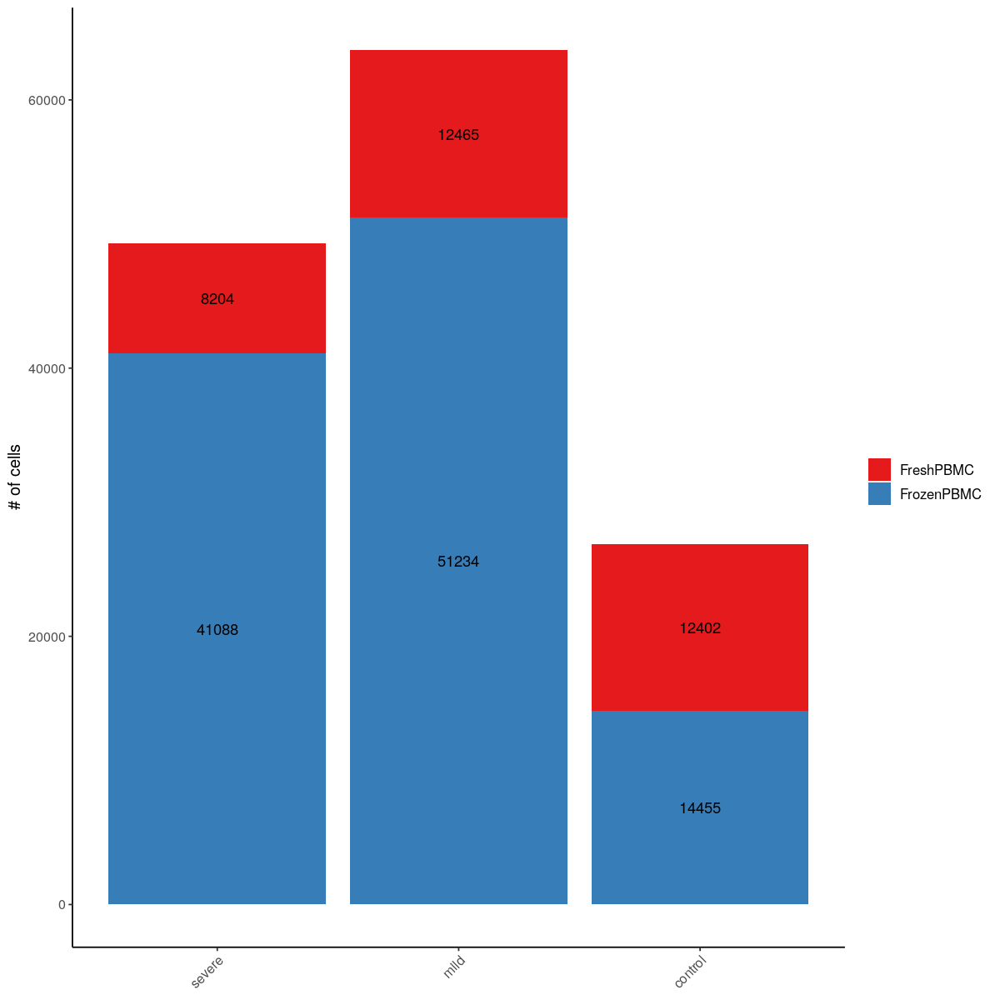

In [5]:
ggplot(seurat_PBMC_FG@meta.data, aes(x = group_per_sample , fill= purification))+
  geom_bar()+
  geom_text(stat='count', aes(label=..count..), position = position_stack(vjust = 0.5))+
  theme_classic()+
  theme(
    panel.grid=element_blank(),
    legend.text=element_text(size=10),
    text = element_text(size=12),
    legend.title = element_blank(),
    axis.title.x = element_blank()
  )+  
  ylab("# of cells")+
  scale_fill_manual(values = color_clusters)+ 
  RotatedAxis() 

## Group vs Sample

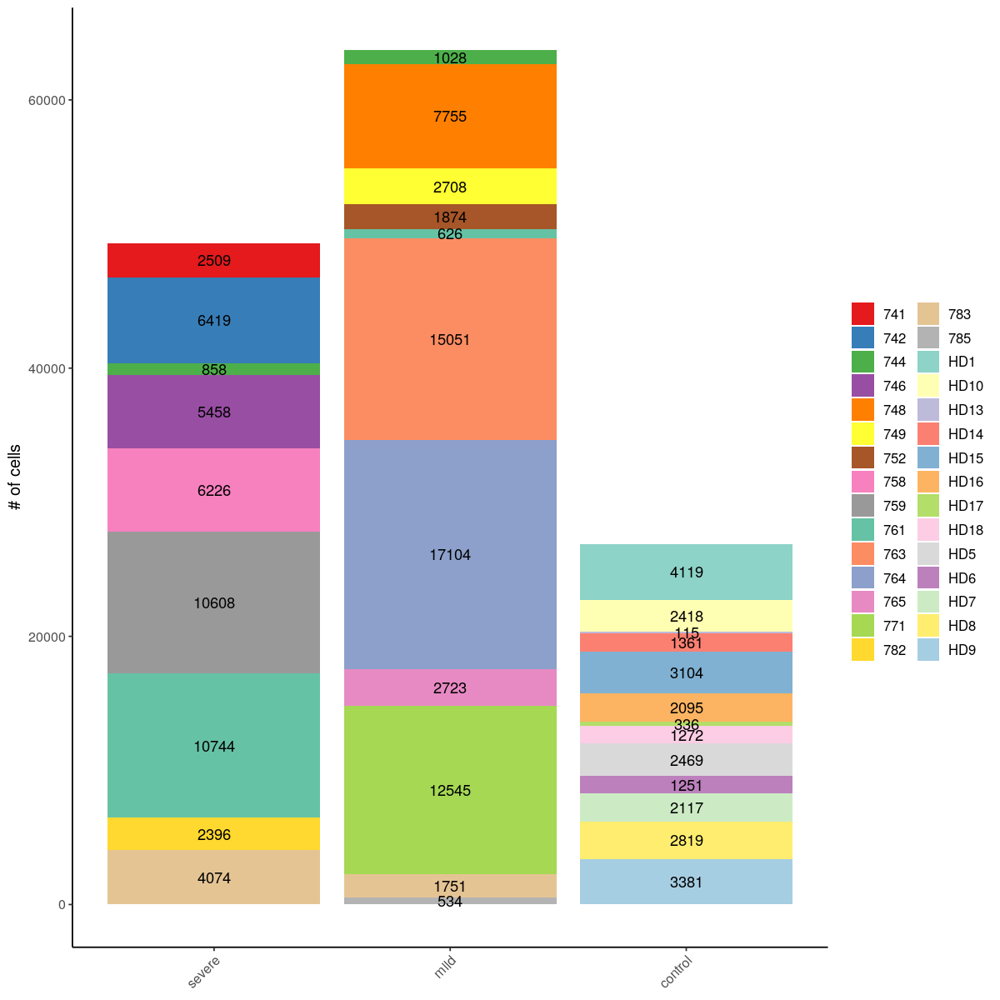

In [6]:
ggplot(seurat_PBMC_FG@meta.data, aes(x =  group_per_sample , fill= donor))+
  geom_bar()+
  geom_text(stat='count', aes(label=..count..), position = position_stack(vjust = 0.5))+
  theme_classic()+
  theme(
    panel.grid=element_blank(),
    legend.text=element_text(size=10),
    text = element_text(size=12),
    legend.title = element_blank(),
    axis.title.x = element_blank()
  )+  
  ylab("# of cells")+
  scale_fill_manual(values = color_clusters)+ 
  RotatedAxis() 

## Analyze PBMC data set

In [7]:
# Normalization

seurat_PBMC_FG <- NormalizeData(object = seurat_PBMC_FG, normalization.method = "LogNormalize", scale.factor = 1e4)

# Define variable genes

seurat_PBMC_FG <- FindVariableFeatures(object = seurat_PBMC_FG, 
                                   assay="RNA",
                                   selection.method = 'vst')

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”
When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 1209 rows containing missing values (geom_point).”


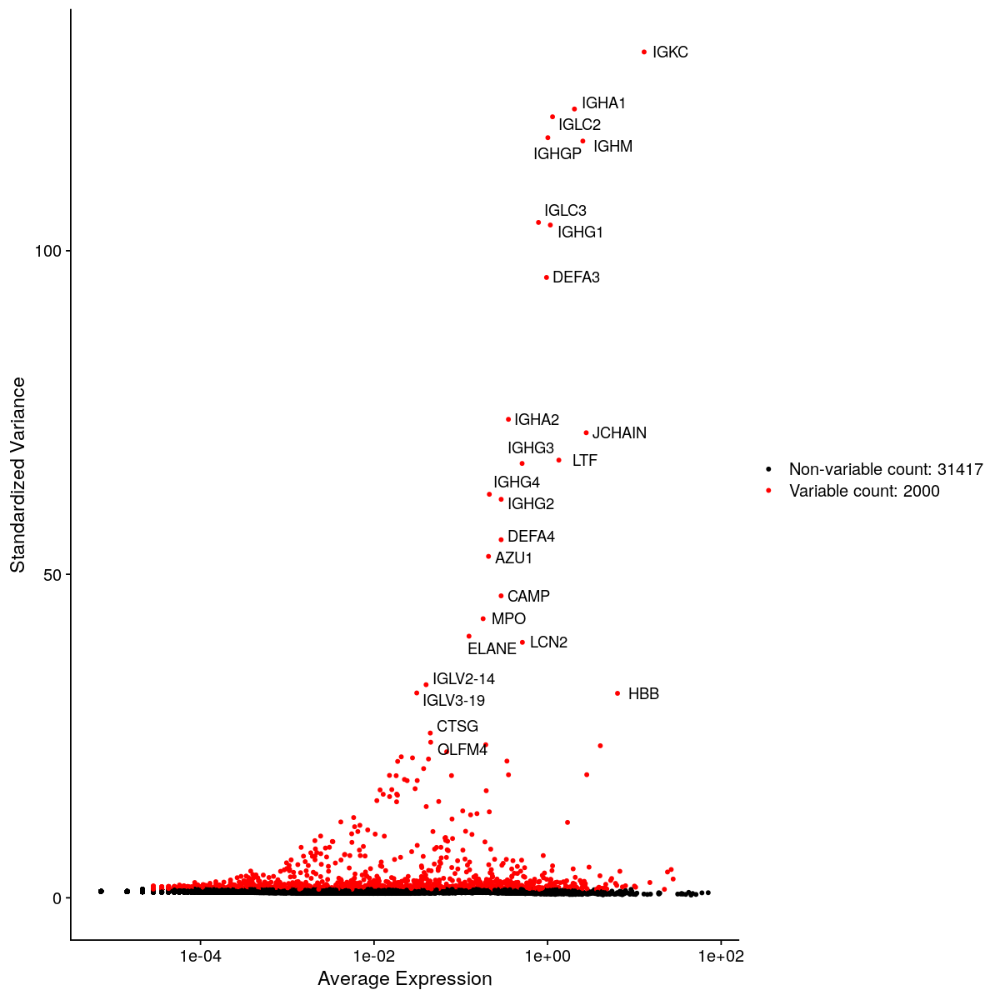

In [8]:
# Identify the 10 most highly variable genes
top25 <- head(VariableFeatures(seurat_PBMC_FG), 25)

# plot variable features with labels
plot1 <- VariableFeaturePlot(seurat_PBMC_FG)
plot2 <- LabelPoints(plot = plot1, points = top25, repel = TRUE)

plot2

In [ ]:
# scale data

seurat_PBMC_FG <- ScaleData(object = seurat_PBMC_FG,
                               vars.to.regress = c("nCount_RNA"))

# PCA

seurat_PBMC_FG <- RunPCA(object = seurat_PBMC_FG, features = VariableFeatures(object = seurat_PBMC_FG), verbose = FALSE)

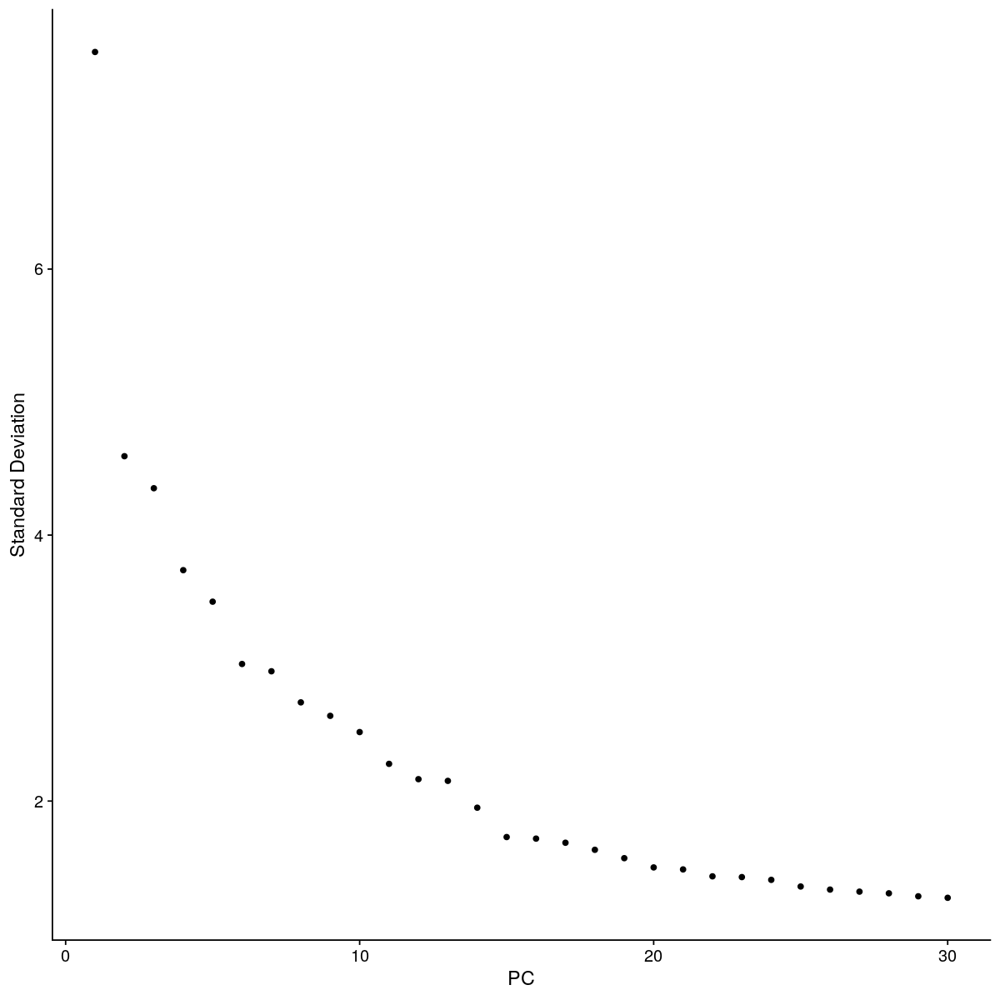

In [10]:
ElbowPlot(object = seurat_PBMC_FG, 30)

## UMAP

In [ ]:
seurat_PBMC_FG <- RunUMAP(seurat_PBMC_FG, reduction = "pca", dims = 1:20, seed.use = 42)

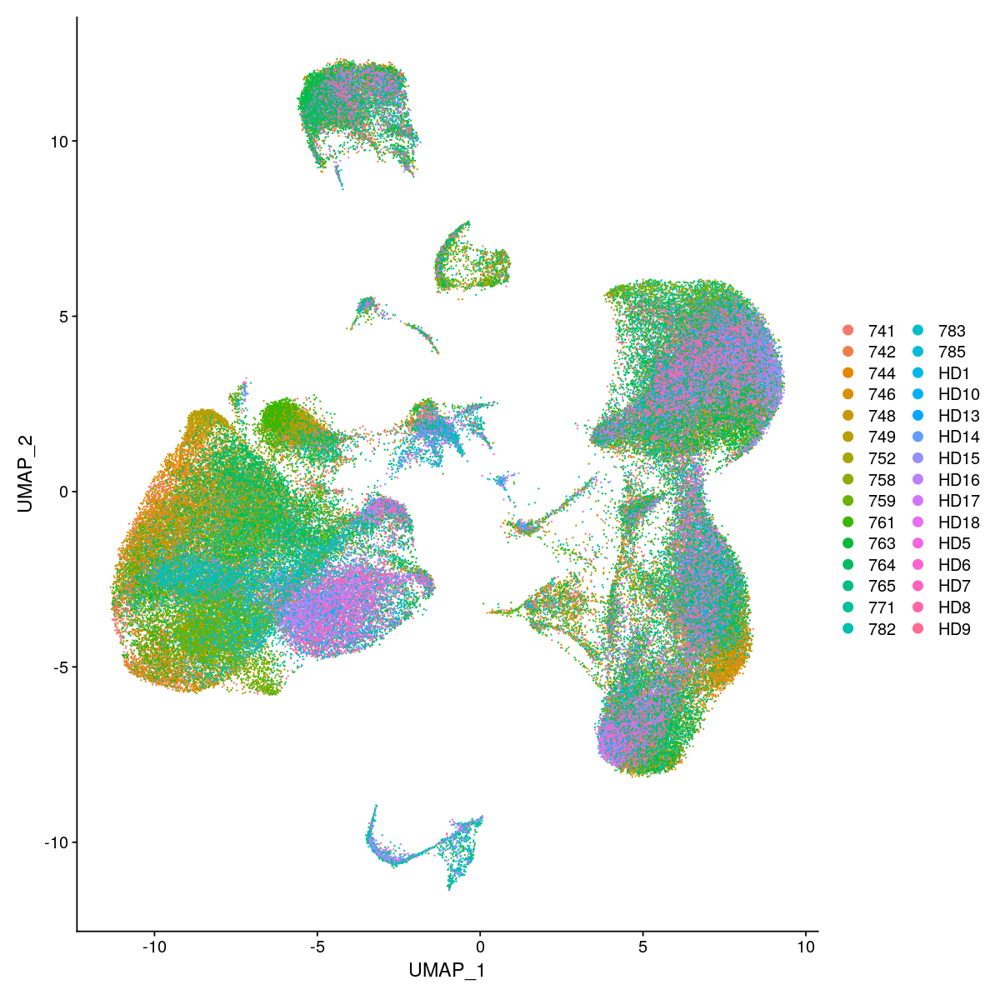

In [17]:
DimPlot(object = seurat_PBMC_FG, 
        reduction = 'umap', 
        label = FALSE, 
        group.by = "donor"
        )

Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”


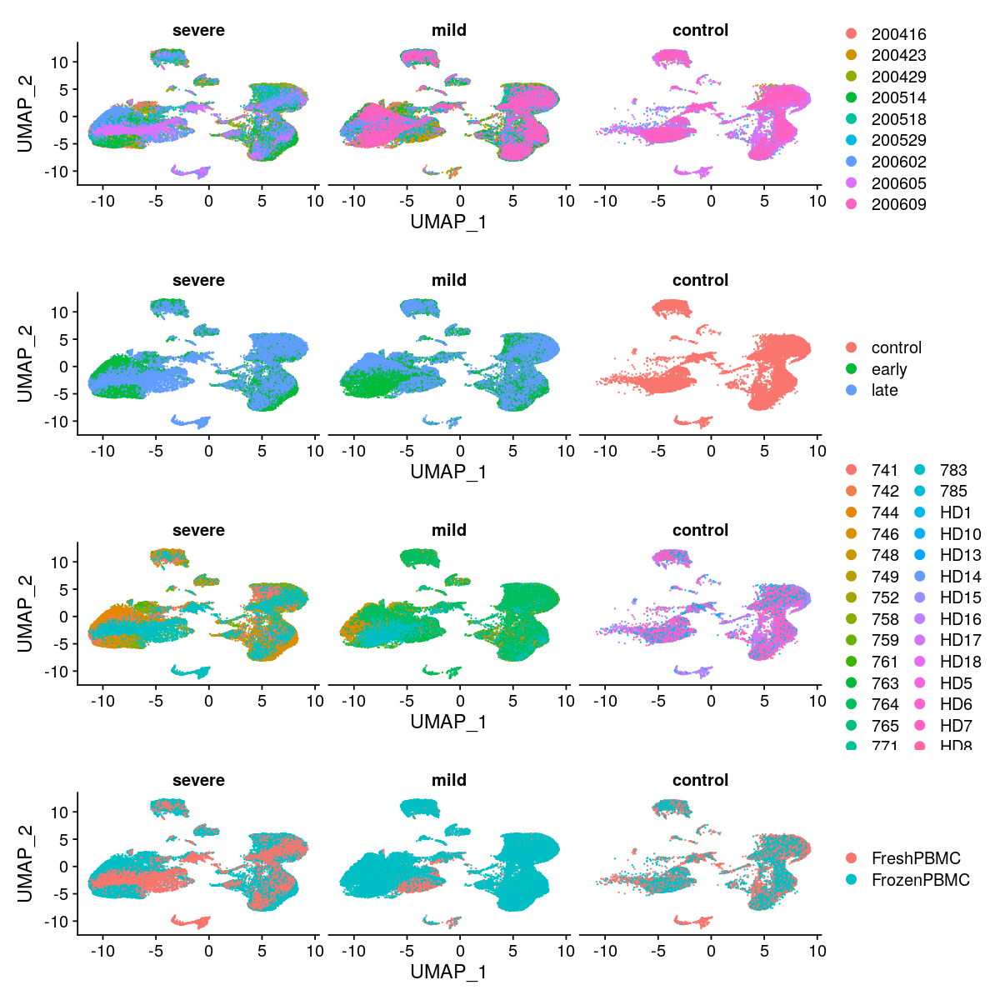

In [18]:
p1 <- DimPlot(object = seurat_PBMC_FG, 
        reduction = 'umap', 
        label = FALSE, 
        group.by = "experiment", 
        split.by = "group_per_sample")

p2 <- DimPlot(object = seurat_PBMC_FG, 
        reduction = 'umap', 
        label = FALSE, 
        group.by = "disease_stage", 
        split.by = "group_per_sample")

p3 <- DimPlot(object = seurat_PBMC_FG, 
        reduction = 'umap', 
        label = FALSE, 
        group.by = "donor", 
        split.by = "group_per_sample"
        )

p4 <- DimPlot(object = seurat_PBMC_FG, 
        reduction = 'umap', 
        label = FALSE, 
        group.by = "purification", 
        split.by = "group_per_sample"
        )

CombinePlots(plots = list(p1,p2,p3,p4), ncol=1)

## SingleR

In [ ]:
library(celldex)
hpca.se <- HumanPrimaryCellAtlasData()
blueprint.se <- BlueprintEncodeData()
monaco.se <- MonacoImmuneData()
immune.se <- ImmGenData()
dmap.se <- DatabaseImmuneCellExpressionData()
hemato.se <- NovershternHematopoieticData()

In [ ]:
input <- GetAssayData(object = seurat_PBMC_FG, slot = "data", assay = "RNA")

singleR.list <- list()

# perform singleR classification
singleR.list$hpca <- SingleR(test = input, 
                             method="single",
                             fine.tune=FALSE,
                             ref = hpca.se, 
                             labels = hpca.se$label.main)

singleR.list$blueprint <- SingleR(test = input, 
                                  method="single",
                                  fine.tune=FALSE,
                                  ref = blueprint.se, 
                                  labels = blueprint.se$label.main)

singleR.list$monaco <- SingleR(test = input, 
                               method="single",
                               fine.tune=FALSE,
                               ref = monaco.se, 
                               labels = monaco.se$label.main)

singleR.list$immune <- SingleR(test = input, 
                               method="single",
                               fine.tune=FALSE,
                               ref = immune.se, 
                               labels = immune.se$label.main)



In [30]:
singleR.list$dmap <- SingleR(test = input, 
                             method="single",
                             fine.tune=FALSE,
                             ref = dmap.se, 
                             labels = dmap.se$label.main)

singleR.list$hemato <- SingleR(test = input, 
                               method="single",
                               fine.tune=FALSE,
                               ref = hemato.se, 
                               labels = hemato.se$label.main)

rm(input)

seurat_PBMC_FG$hpca.labels <- singleR.list$hpca$labels
seurat_PBMC_FG$blueprint.labels <- singleR.list$blueprint$labels
seurat_PBMC_FG$monaco.labels <- singleR.list$monaco$labels
seurat_PBMC_FG$immune.labels <- singleR.list$immune$labels
seurat_PBMC_FG$dmap.labels <- singleR.list$dmap$labels
seurat_PBMC_FG$hemato.labels <- singleR.list$hemato$labels

Warning message:
“'method="cluster"' is no longer necessary when 'cluster=' is specified”
Warning message:
“'method="cluster"' is no longer necessary when 'cluster=' is specified”


In [ ]:
options(repr.plot.width=20, repr.plot.height=10)

p1 <- DimPlot(object = seurat_PBMC_FG, reduction = 'umap', label = FALSE, group.by ="hemato.labels") + 
  ggtitle("Hematopoietic labels")+scale_color_manual(values=singleR_colors)
p2 <- DimPlot(object = seurat_PBMC_FG, reduction = 'umap', label = FALSE, group.by ="hpca.labels") + 
  ggtitle("HPCA")+scale_color_manual(values=singleR_colors)
p3 <- DimPlot(object = seurat_PBMC_FG, reduction = 'umap', label = FALSE, group.by ="blueprint.labels") +
  ggtitle("Blueprint-Encode")+scale_color_manual(values=singleR_colors)
p4 <- DimPlot(object = seurat_PBMC_FG, reduction = 'umap', label = FALSE, group.by ="monaco.labels") + 
  ggtitle("Monaco")+scale_color_manual(values=singleR_colors)
p5 <- DimPlot(object = seurat_PBMC_FG, reduction = 'umap', label = FALSE, group.by ="immune.labels") + 
  ggtitle("Immune")+scale_color_manual(values=singleR_colors)
p6 <- DimPlot(object = seurat_PBMC_FG, reduction = 'umap', label = FALSE, group.by ="dmap.labels") + 
  ggtitle("DMAP")+scale_color_manual(values=singleR_colors)

CombinePlots(plots = list(p1, p2, p3, p4, p5, p6), ncol=1)

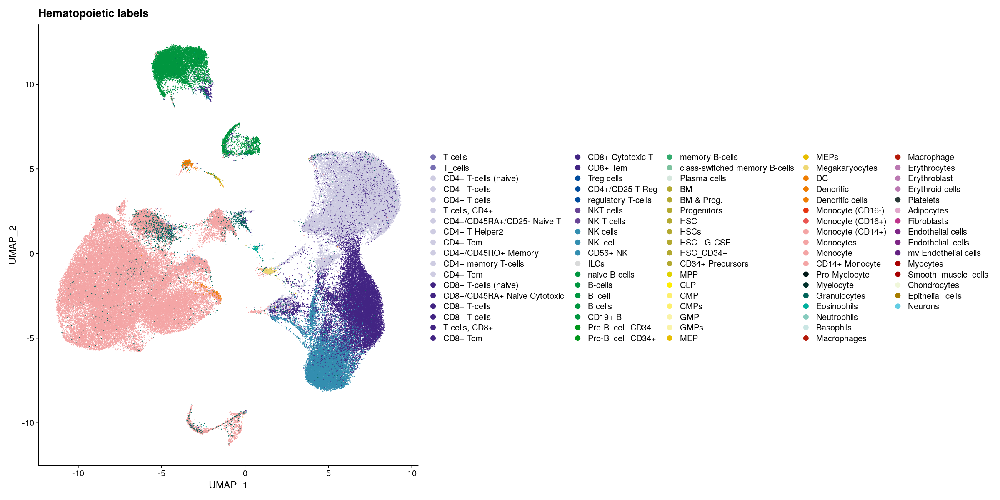

In [34]:
p1

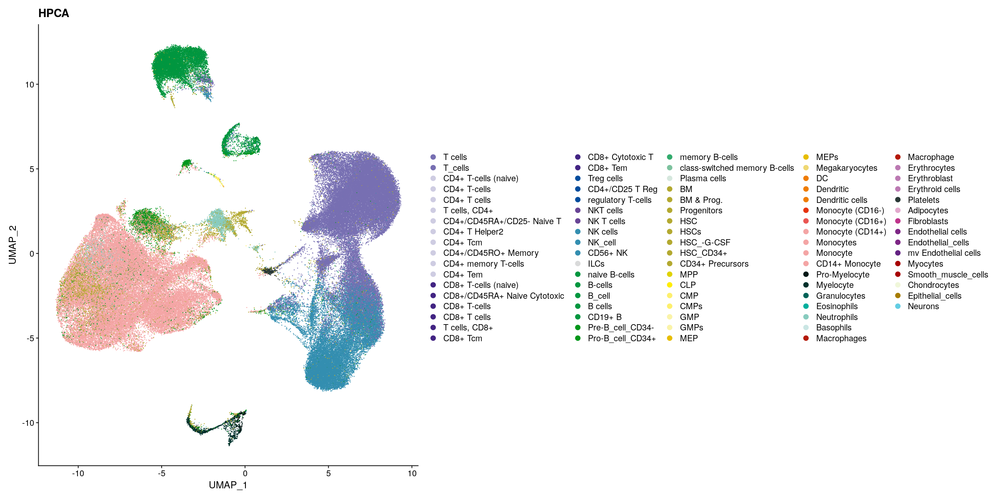

In [35]:
p2

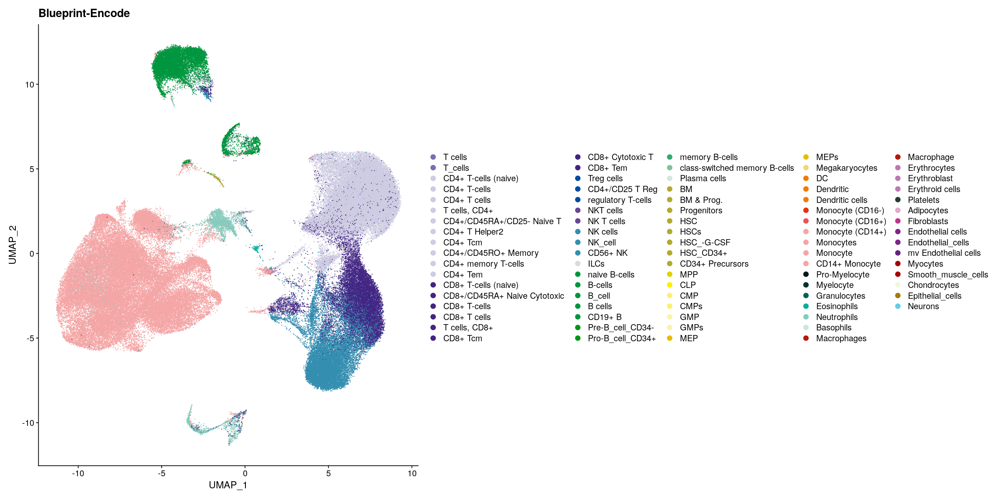

In [36]:
p3

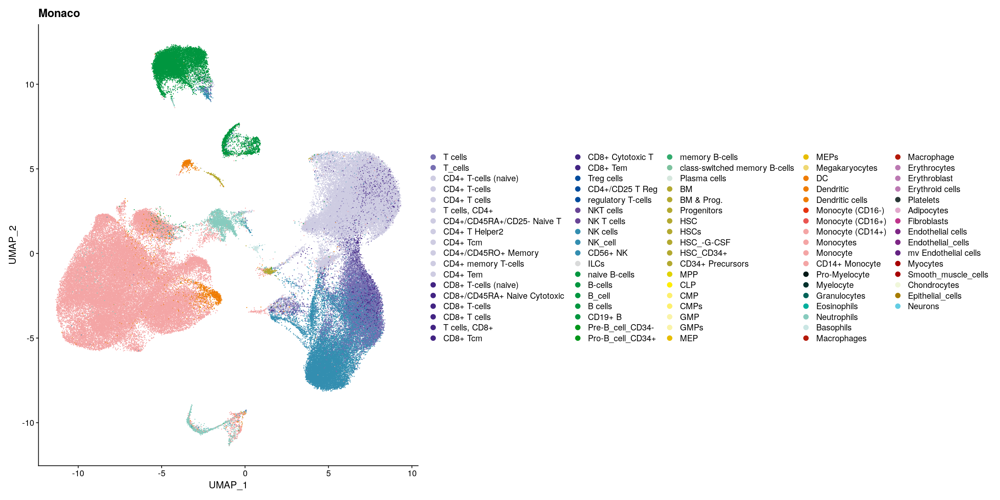

In [37]:
p4

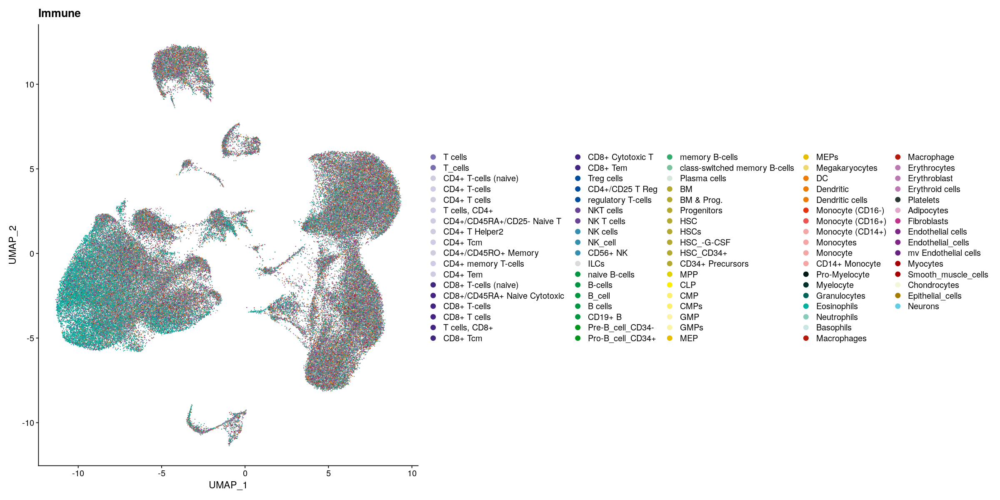

In [38]:
p5

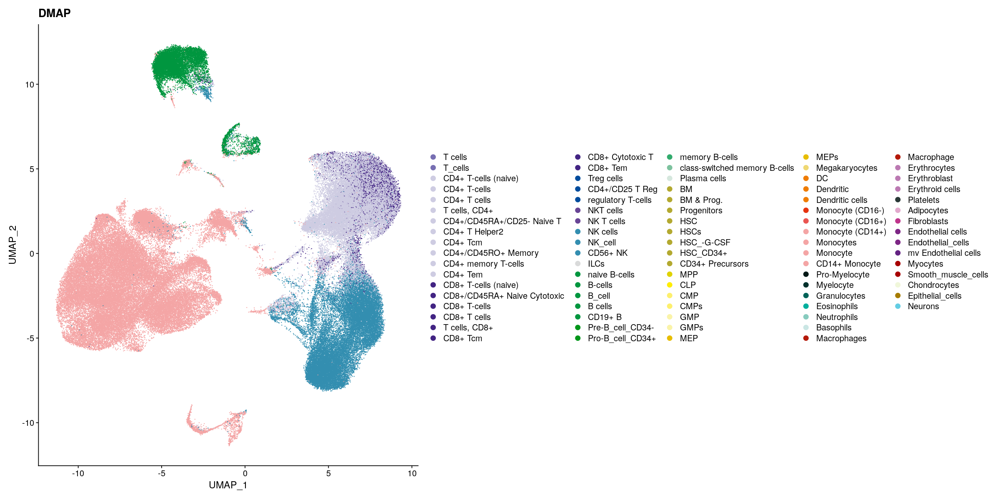

In [39]:
p6

## Clustering

Find neighbours

In [40]:
seurat_PBMC_FG <- FindNeighbors(object = seurat_PBMC_FG, dims = 1:20, reduction="pca", force.recalc = TRUE)

Computing nearest neighbor graph

Computing SNN



Calculate final clusters

In [41]:
seurat_PBMC_FG <- FindClusters(object = seurat_PBMC_FG, resolution = 0.4, algorithm = 1)
seurat_PBMC_FG$RNA_snn_res.0.4 <- factor(seurat_PBMC_FG$RNA_snn_res.0.4, levels = c(0:20))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 139848
Number of edges: 4028168

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9287
Number of communities: 21
Elapsed time: 64 seconds


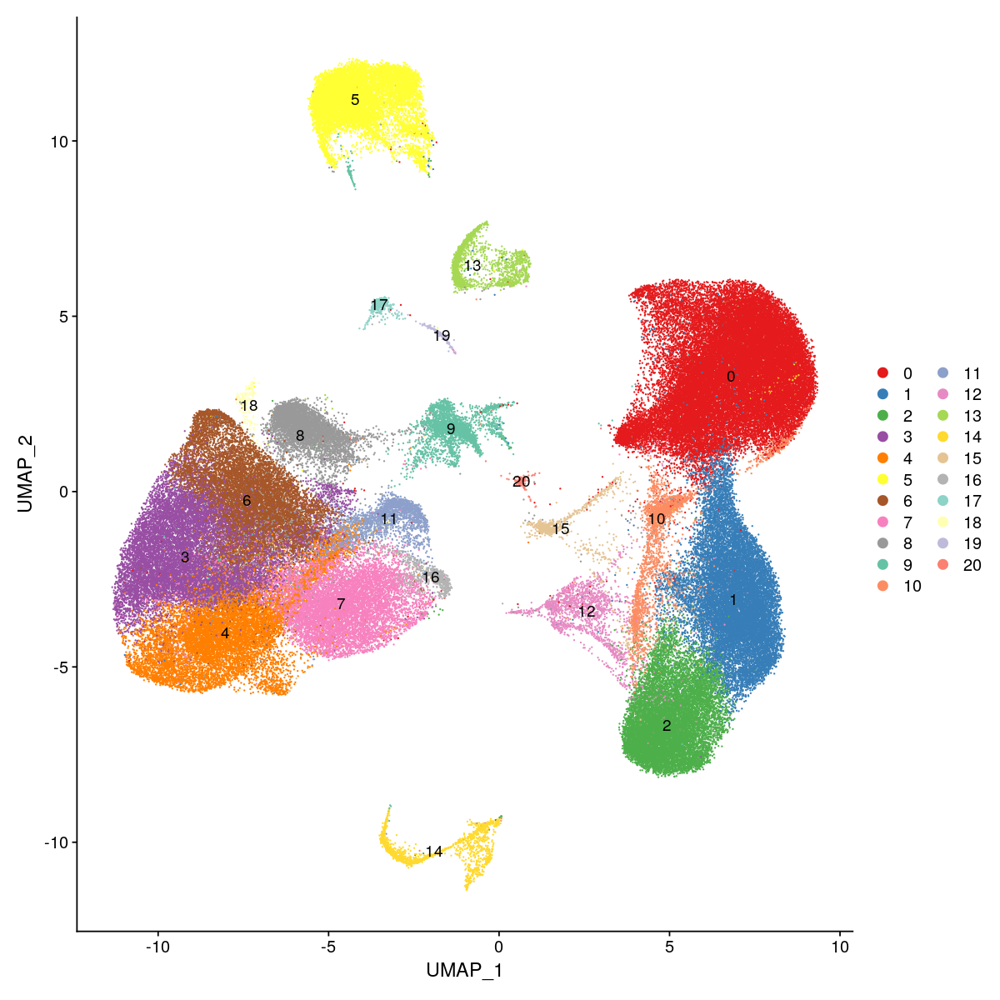

In [45]:
options(repr.plot.width=10, repr.plot.height=10)

p<- DimPlot(object = seurat_PBMC_FG,
        reduction = 'umap',
        group.by="RNA_snn_res.0.4",
        label = TRUE) + scale_color_manual(values=color_clusters)
p

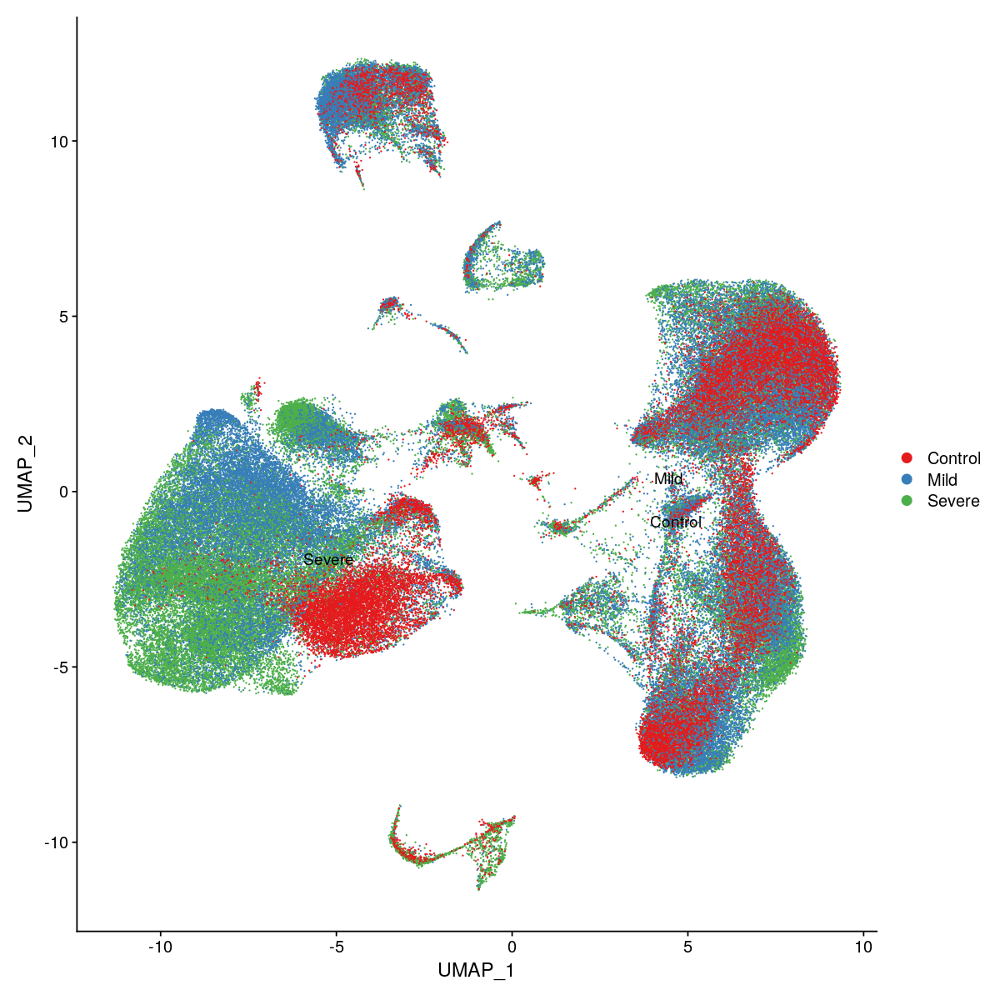

In [46]:
options(repr.plot.width=10, repr.plot.height=10)

p<- DimPlot(object = seurat_PBMC_FG,
        reduction = 'umap',
        group.by="Condition",
        label = TRUE) + scale_color_manual(values=color_clusters)
p

Rename and recolor clusters

In [43]:
cluster_naming_res.0.4 <- data.frame(cluster = c(0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20),
                                     type = c("CD4+ T cells", # 0
                                              "CD8+ T cells", # 1
                                              "NK cells", # 2
                                              "HLA-DRlo S100Ahi Monocytes", # 3
                                              "HLA-DRlo CD163hi Monocytes", # 4
                                              "B cells", # 5
                                              "HLA-DRhi CD83hi Monocytes", # 6
                                              "Classical Monocytes", # 7
                                              "mixed_1", # 8
                                              "Neutrophils", # 9
                                              "Activated T cells", # 10
                                              "Non-classical Monocytes", # 11
                                              "Prol. cells", # 12
                                              "Plasmablasts", # 13
                                              "Immature Neutrophils", # 14
                                              "Megakaryocytes", # 15
                                              "mDC", # 16
                                              "pDC", # 17
                                              "mixed_2", # 18
                                              "Progenitors", # 19
                                              "undefined" # 20
                                              ),
                                     new_order = c(9, 10, 13, 3, 2, 14, 1, 0, 19, 5, 11, 4, 12, 15, 6, 16, 7, 8, 20, 17, 18),
                                     color = c("#DE342F", # CD4+ T cells"
                                               "#3F81B9", # CD8+ T cells
                                               "#1F405C", # NK cells
                                               "#5E2870", # HLA-DR- monocytes (severe late)
                                               "#9D43BB", # HLA-DR- IFIT+ monocytes (severe early) 
                                               "#A34F23", # B cells
                                               "#59BF30", # C5AR1+ inflamm. monocytes (mild)
                                               "#816b88", # HLA-DR+ classical monocytes (control)
                                               "#D6E9D8", # mixed_1
                                               "#638B83", # Neutrophils
                                               "#097082", # Activated T cells
                                               "#DB8A0F", # Non-classical Monocytes
                                               "#6FD6E8", # Prol. cells
                                               "#F2895E", # Plasmablasts
                                               "#A6E9DB", # Immature Neutrophils
                                               "#E7C595", # Megakaryocytes
                                               "#FBD64A", # mDC
                                               "#B4DC49", # pDC
                                               "lightgrey", # mixed_2
                                               "#4CA64C", # CD34+ GATA2+ cells
                                               "purple" # CSF2RB+ cells
                                               ), stringsAsFactors = FALSE)


idx <- match(seurat_PBMC_FG$RNA_snn_res.0.4, cluster_naming_res.0.4$cluster)

# re-level cell types
seurat_PBMC_FG[['cluster_labels_res.0.4']] <- factor(cluster_naming_res.0.4$type[idx],levels=c("Classical Monocytes", # 0
                                                                                            "HLA-DRhi CD83hi Monocytes", # 1
                                                                                            "HLA-DRlo CD163hi Monocytes", # 2
                                                                                            "HLA-DRlo S100Ahi Monocytes", # 3
                                                                                            "Non-classical Monocytes", # 4
                                                                                            "Neutrophils", # 5
                                                                                            "Immature Neutrophils", # 6
                                                                                            "mDC", # 7
                                                                                            "pDC", # 8
                                                                                            "CD4+ T cells", # 9
                                                                                            "CD8+ T cells", # 10
                                                                                            "Activated T cells", # 11
                                                                                            "Prol. cells", # 12
                                                                                            "NK cells", # 13
                                                                                            "B cells", # 14
                                                                                            "Plasmablasts", # 15
                                                                                            "Megakaryocytes", # 16
                                                                                            "Progenitors", # 17
                                                                                            "undefined", # 18
                                                                                            "mixed_1", # 19
                                                                                            "mixed_2" # 20
                                                                                            ))

seurat_PBMC_FG[['new_order']] <- cluster_naming_res.0.4$new_order[idx]

# set colors
color_cluster_labels <- cluster_naming_res.0.4$color
names(color_cluster_labels) <- cluster_naming_res.0.4$type

color_cluster_new_order <- cluster_naming_res.0.4$color
names(color_cluster_new_order) <- cluster_naming_res.0.4$new_order

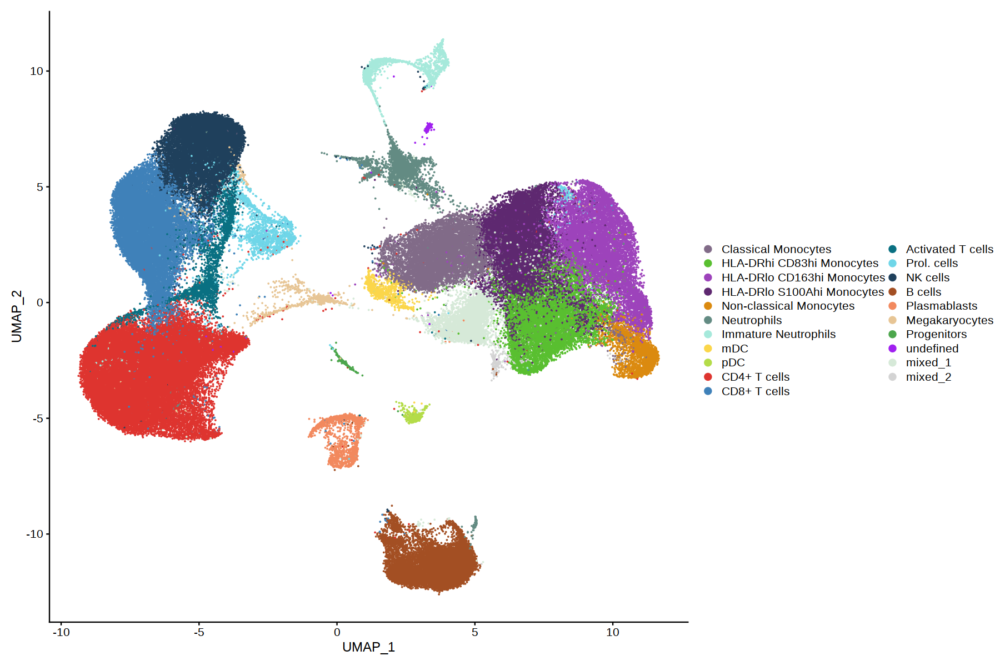

In [14]:
options(repr.plot.width=15, repr.plot.height=10)

p<- DimPlot(object = seurat_PBMC_FG,
            reduction = 'umap',
            group.by="cluster_labels_res.0.4",
            label = F) +  
  scale_color_manual(values=color_cluster_labels)
p

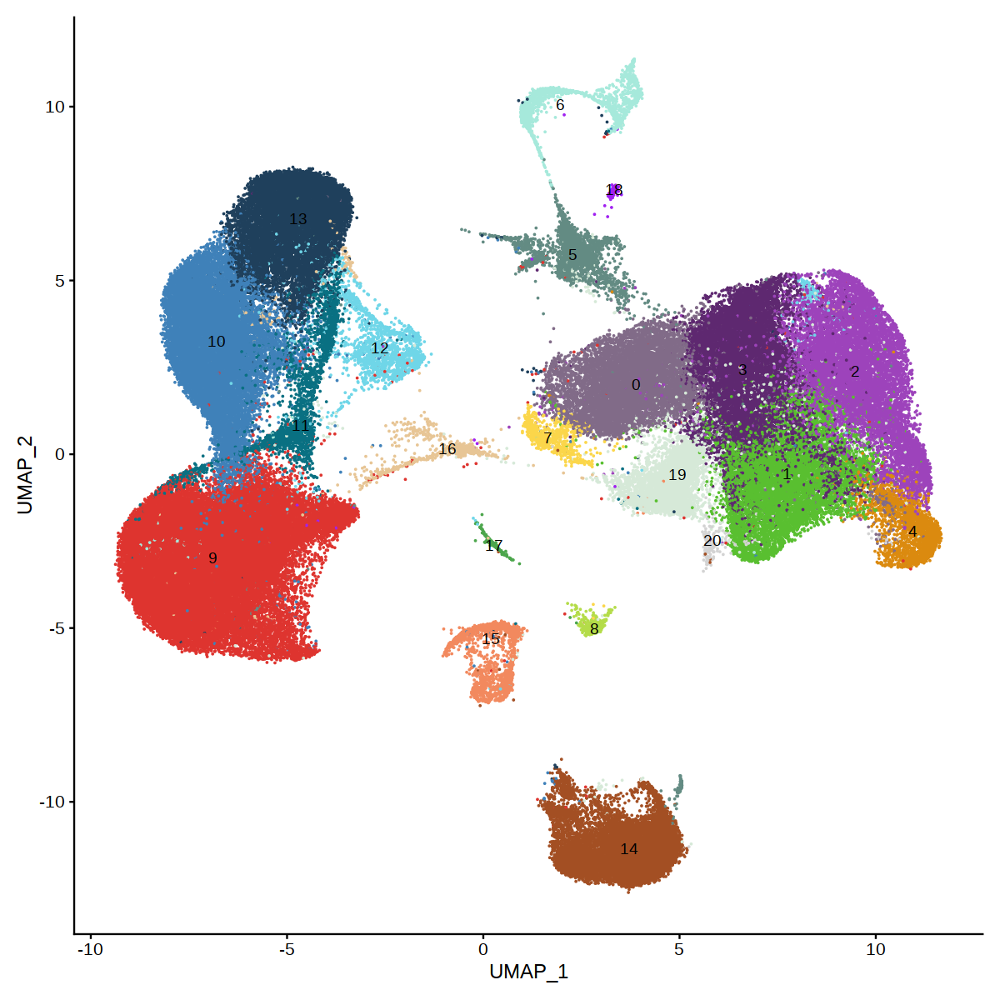

In [15]:
options(repr.plot.width=10, repr.plot.height=10)

p<- DimPlot(object = seurat_PBMC_FG,
            reduction = 'umap',
            group.by="new_order",
            label = TRUE) +  NoLegend()+  
  scale_color_manual(values=color_cluster_new_order)
p

## Identify cluster marker genes

In [ ]:
Idents(seurat_PBMC_FG) <- "RNA_snn_res.0.4"
cluster.markers.wilcox_res.0.4 <- FindAllMarkers(object = seurat_PBMC_FG,
                                                only.pos = TRUE,
                                                min.pct = 0.2,
                                                logfc.threshold = 0.2,
                                                min.diff.pct = 0.1,
                                                test.use = "wilcox"
)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12



Dot plot of cluster marker genes

In [ ]:
idx <- match(cluster.markers.wilcox_res.0.4$cluster, cluster_naming_res.0.4$cluster)
cluster.markers.wilcox_res.0.4$new_order <- cluster_naming_res.0.4$new_order[idx]
cluster.markers.wilcox_res.0.4$cell_type <- cluster_naming_res.0.4$type[idx]
cluster.markers.wilcox_res.0.4 <- cluster.markers.wilcox_res.0.4[order(cluster.markers.wilcox_res.0.4$new_order),]

top <- cluster.markers.wilcox_res.0.4 %>% group_by(new_order) %>% top_n(n = 5, wt = abs(avg_logFC))

p <- DotPlot(seurat_PBMC_FG,
       group.by = "new_order", 
       features = unique(top$gene),col.min = -1.5, col.max = 1.5)+ 
 scale_color_gradientn(colors = rev(RColorBrewer::brewer.pal(n =100, name = "RdBu")))+
 theme(axis.title = element_blank()) + theme(axis.text.x = element_text(angle = 90, hjust = 1)) + 
 coord_flip() + theme(axis.text.x = element_text(angle = 0, vjust = 0.5, hjust=1))

p